<a href="https://colab.research.google.com/github/yash2998chhabria/272-Search-Engine/blob/main/MultiModal_Search.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:

!7z x '/content/drive/MyDrive/Multimodal_dataset/roco-dataset.zip' 
# ! mv /content/roco-dataset  /content/drive/MyDrive/Multimodal_dataset/roco/


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,4 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/drive/MyDrive/Multimodal_dataset/                                                    1 file, 6653353904 bytes (6346 MiB)

Extracting archive: /content/drive/MyDrive/Multimodal_dataset/roco-dataset.zip
  4% 4096 Open               79% 69632 Open               --
Path = /content/drive/MyDrive/Multimodal_dataset/roco-dataset.zip
Type = zip
Physical Size = 6653353904
64-bit = +

  0%      0% 54 - roco-dataset/.git/objects/pack/ . 570e89f55698d23eee428c6e129.pack                                          

In [2]:
import numpy as np
import pandas as pd
import tensorflow as tf

In [3]:
physical_devices = tf.config.experimental.list_physical_devices('GPU')
assert len(physical_devices) > 0, "Not enough GPU hardware devices available"
config = tf.config.experimental.set_memory_growth(physical_devices[0], True)

In [4]:
def create_df_set(filepath):
  captions = open(filepath, 'r')

  captions_set = set()

  for line in captions:
      image_num = ""
      image_description = ""

      for i in range(len(line)):
        if line[i] == '\t':
          image_num = line[:i]
          image_description = line[i+1:].strip()
          captions_set.add((image_num,image_description))
          continue

  return captions_set



In [5]:
train_captions_set = create_df_set('/content/roco-dataset/data/train/radiology/captions.txt')
train_df = pd.DataFrame(train_captions_set, columns =['Image_num', 'Image_description'])

In [6]:
test_captions_set = create_df_set('/content/roco-dataset/data/test/radiology/captions.txt')
test_df = pd.DataFrame(test_captions_set, columns =['Image_num', 'Image_description'])

In [7]:
print(train_df.count())
test_df.count()

Image_num            65450
Image_description    65450
dtype: int64


Image_num            8179
Image_description    8179
dtype: int64

In [8]:
import matplotlib.pyplot as plt
from PIL import Image

CT scan demonstrating a solid lesion in the tail of pancreas with splenomegaly and enlargement of the splenic vein (arrow).


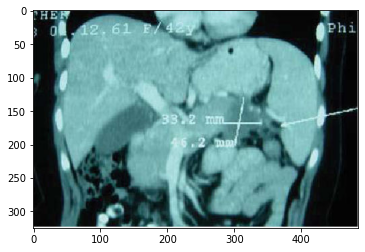

Chest computed tomography scan taken 3 months after initiation of voriconazole, showing decreased lung consolidation but a residual lesion.


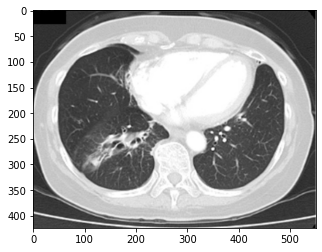

Figure 6. Follow up sonography at three months showing pseudotumor appearance


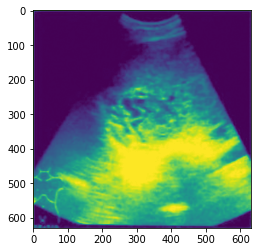

Scanner abdominal, coupe transversale


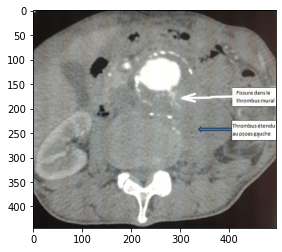

An axial CT image through the mid sacrum demonstrates an additional irregular region of sclerosis and periosteal new bone extending from midline to the right (arrows). [Powerpoint Slide]


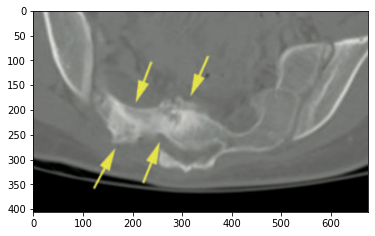

In [9]:
%matplotlib inline

for index,row in train_df.iterrows():
  if index == 5:
    break
  print(row['Image_description'])
  imagePath = '/content/roco-dataset/data/train/radiology/images/'+row['Image_num']+'.jpg'
  pil_im = Image.open(imagePath, 'r')
  plt.figure()
  plt.imshow(pil_im)
  plt.show()
  


In [11]:
 !pip install sentence_transformers
from sentence_transformers import SentenceTransformer, util
model = SentenceTransformer('stsb-distilbert-base')
model.max_seq_length = 128

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 79 kB 5.2 MB/s 
     |████████████████████████████████| 4.2 MB 17.6 MB/s 
     |████████████████████████████████| 1.2 MB 68.9 MB/s 
     |████████████████████████████████| 86 kB 7.3 MB/s 
     |████████████████████████████████| 6.6 MB 67.3 MB/s 
     |████████████████████████████████| 596 kB 77.7 MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.0-py3-none-any.whl size=120747 sha256=d34edcc877375a62b535a7ef9986676208c38575de95abcc43d36507a08e4193
  Stored in directory: /root/.cache/pip/wheels/83/c0/df/b6873ab7aac3f2465aa9144b6b4c41c4391cfecc027c8b07e7
Successfully built sentence-transformers
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


Downloading:   0%|          | 0.00/523 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.93k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/539 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/265M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/489 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

In [12]:
# IMG_SIZE = 224
# size = (IMG_SIZE,IMG_SIZE)
# img_model = tf.keras.applications.MobileNet(input_shape = (IMG_SIZE, IMG_SIZE, 3), include_top = False, weights = 'imagenet' )


17235968/17225924 [==============================] - 0s 0us/step


In [37]:
IMG_SIZE = 224
size = (IMG_SIZE,IMG_SIZE)
img_model = tf.keras.applications.MobileNetV2(input_shape = (IMG_SIZE, IMG_SIZE, 3), include_top = False, weights = 'imagenet' )


9420800/9406464 [==============================] - 0s 0us/step


In [13]:
def get_textEmbeddings(model,text):
    text_embedding = model.encode(text, convert_to_tensor=True)
    return text_embedding

In [38]:
def get_imageEmbeddings(model,imagePath):
    image = tf.keras.preprocessing.image.load_img(imagePath,target_size= size)
    input_arr = tf.keras.preprocessing.image.img_to_array(image)
    input_arr = np.array([input_arr])
    img_embeddings = model(input_arr)
    meanImgEmb1 = np.mean(img_embeddings,axis =0)
    meanImgEmb2 = np.mean(meanImgEmb1,axis=0)
    meanImgEmb = np.mean(meanImgEmb2,axis=0)
    return meanImgEmb

In [15]:
import os.path

def drop_invalid_rows(df,path):
    rows_to_drop=[]
    for index,row in df.iterrows():
        imagePath = path+row['Image_num']+'.jpg'
        if not os.path.exists(imagePath):
            rows_to_drop.append(index)
    df = df.drop(labels=rows_to_drop, axis=0)
    return df

In [16]:
X_train = drop_invalid_rows(train_df,'/content/roco-dataset/data/train/radiology/images/')
X_test = drop_invalid_rows(test_df,'/content/roco-dataset/data/test/radiology/images/')

In [39]:
# import numpy as np
print(np.shape(X_train))
print(np.shape(X_test))

(65423, 2)
(8176, 2)


In [40]:
import time
text_embeddings={}
image_embeddings={}
start_time = time.time()
count = 0
for index,row in  X_train.iterrows():
    txt_emb = get_textEmbeddings(model,str(row[1]))
    imagePath = '/content/roco-dataset/data/train/radiology/images/'+row[0]+'.jpg'
    img_emb = get_imageEmbeddings(img_model,imagePath)
    text_embeddings[row[0]] = txt_emb
    image_embeddings[row[0]] = img_emb
    count += 1
    print(count, end=" ")
end_time = time.time()
print(str(end_time-start_time))


1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276 277 

In [41]:
import pickle
with open('/content/drive/MyDrive/Multimodal_dataset/textEmbV2','wb') as handle:
    pickle.dump(text_embeddings,handle)
with open('/content/drive/MyDrive/Multimodal_dataset/imgEmbV2','wb') as handle:
    pickle.dump(image_embeddings,handle)

In [58]:
import pickle
with open(r"/content/drive/MyDrive/Multimodal_dataset/textEmbV2", "rb") as handle:
  text_embeddings = pickle.load(handle)

with open(r"/content/drive/MyDrive/Multimodal_dataset/imgEmbV2", "rb") as handle:
  image_embeddings = pickle.load(handle)

In [59]:
cembList=[]
imageList=[]
titleList=[]
for index, row in X_train.iterrows():
    txt_emb = text_embeddings[row[0]].cpu().numpy()
    print(np.shape(txt_emb))
    img_emb = image_embeddings[row[0]]
    print(np.shape(img_emb))
    cmb_emb = np.concatenate((txt_emb,img_emb),axis=0)
    print(np.shape(cmb_emb))
    norm = np.linalg.norm(cmb_emb)
    cmb_emb_normal = cmb_emb/norm
    cembList.append(cmb_emb_normal)
    imageList.append(row[0])
    titleList.append(row[1])

Streaming output truncated to the last 5000 lines.
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,)
(2048,)
(768,)
(1280,

In [60]:
keyList = imageList

In [61]:
from sklearn.neighbors import NearestNeighbors
kneigh = NearestNeighbors(n_neighbors=5,leaf_size=5000,algorithm='kd_tree')
kneigh.fit(cembList)

NearestNeighbors(algorithm='kd_tree', leaf_size=5000)

In [62]:
def getNeighbours(query_emb):
    posting_id_list=[]
    neigh_dist,neigh_ind = kneigh.kneighbors(X=query_emb.reshape(1,-1), n_neighbors=5, return_distance=True)
    for ind in neigh_ind:
        for ind1 in ind:
            posting_id_list.append(str(ind1))
    return posting_id_list

In [63]:
postingidList=[]
matchesList=[]
index =0
for val in keyList:
    query_emb = cembList[index]
    postingid_list = getNeighbours(query_emb)
    postingidList.append(val)
    matchesList.append(" ".join(postingid_list))
    index =index +1 
    if index==100:
        break

CT scan demonstrating a solid lesion in the tail of pancreas with splenomegaly and enlargement of the splenic vein (arrow).
ROCO_27297


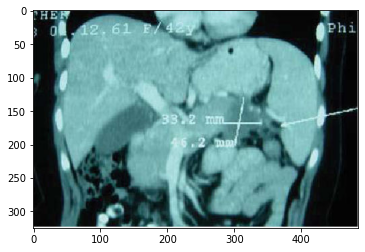

CT scan demonstrating a solid lesion in the tail of pancreas with splenomegaly and enlargement of the splenic vein (arrow).
ROCO_27297


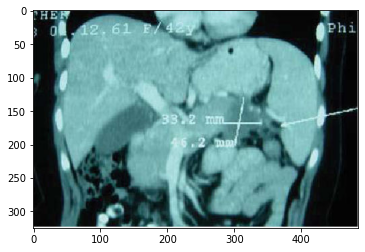

Contrast-enhanced coronal CT reformat shows an amorphous hypoenhancing mass at the pancreatic head (arrow) and intrahepatic and extrahepatic biliary dilatation.
ROCO_32065


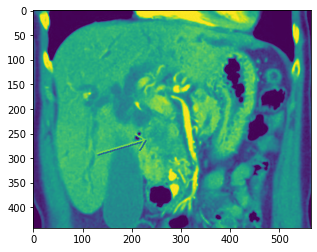

Abdominal computed tomography (CT) scan with IV contrast demonstrates an aortic aneurysm extending from infrarenal 3.8 cm distance to the aortic bifurcation and leaking from left posterolateral wall of the aorta into the retroperitoneal hematoma.
ROCO_12393


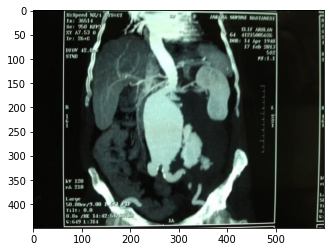

Computed tomographic scan. Densitometric alteration of the tail of the pancreas can be seen (inhomogeneous hypodensity, red arrow)
ROCO_02123


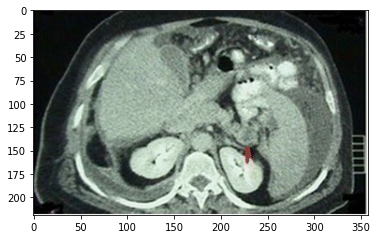

Endoscopic ultrasound image of cystic pancreatic lesion
ROCO_47167


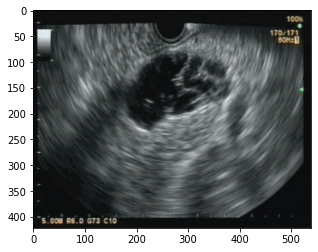

Chest computed tomography scan taken 3 months after initiation of voriconazole, showing decreased lung consolidation but a residual lesion.
ROCO_04451


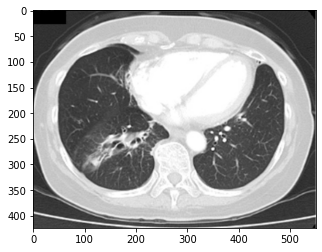

Chest computed tomography scan taken 3 months after initiation of voriconazole, showing decreased lung consolidation but a residual lesion.
ROCO_04451


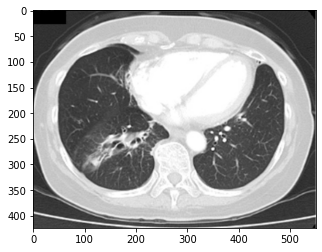

Computed tomographic images of the lungs. Three years after surgery, multiple pulmonary nodules (red arrow) were noted by CT.
ROCO_80988


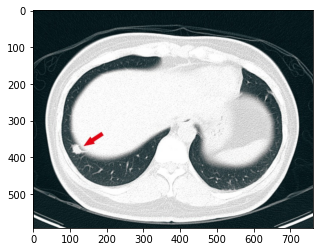

Computed tomography scan of the chest without contrast before starting ipi/nivo. Numerous pulmonary metastases can be seen.
ROCO_59566


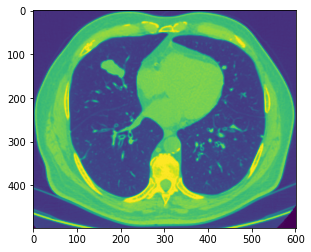

Chest computed tomography shows ground glass opacity and reticular opacities in both lower lobes on admission.
ROCO_58939


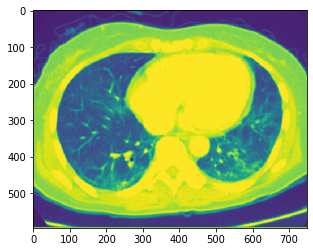

Bilateral diffuse ground-glass opacities in the lower lobe of the lung observed on computed tomography at 4 years of age.
ROCO_49324


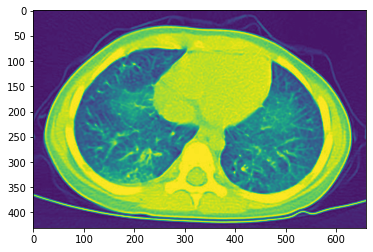

Figure 6. Follow up sonography at three months showing pseudotumor appearance
ROCO_70457


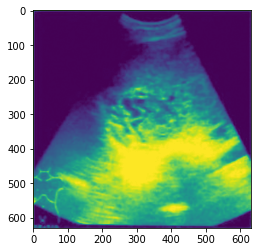

Figure 6. Follow up sonography at three months showing pseudotumor appearance
ROCO_70457


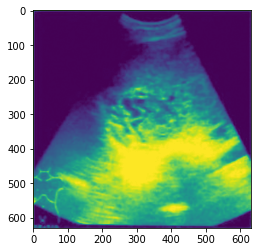

Sonographic findings in blunt diaphragmatic lesions. This transversal ultrasound scan directly shows the ruptured right hemidiaphragm (arrows) surrounded by thickened diaphragm edges (arrowheads). A good acoustic window is present due to a large pleural effusion (a).
ROCO_36876


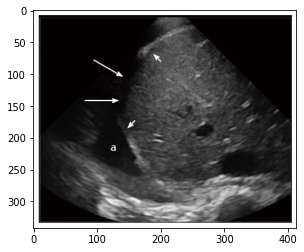

Transverse sonogram of a 14-year-old female with mature cystic teratoma shows multiple floating spherical echogenic structures that differ in size and shape
ROCO_36794


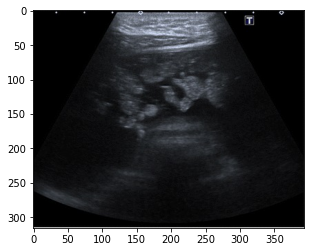

A 9-year-old boy with bleeding per rectum since he was 1 year old. A well-defined slightly hyperechoic lesion (arrow) with subtle hyperechoic rim (arrow head) is seen. This refers to carol atoll sign in nodular regenerative hyperplasia.
ROCO_13987


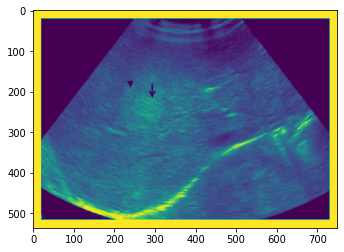

Transverse sonogram of an 18-year-old female with a mature cystic teratoma. There are three dark comet tail appearances (arrows) floating in the interface of the fat-fluid level consistent with hair balls pathologically
ROCO_37097


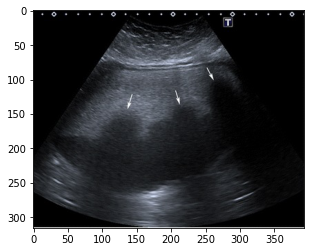

Scanner abdominal, coupe transversale
ROCO_26269


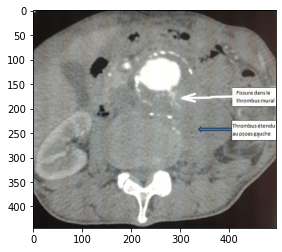

Scanner abdominal, coupe transversale
ROCO_26269


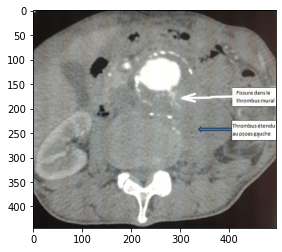

Scanner abdominal, coupe transversale
ROCO_65936


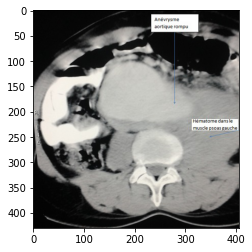

Coupe sagittale d'une IRM pelvienne montrant une lésion retro rectale hypo intense
ROCO_53940


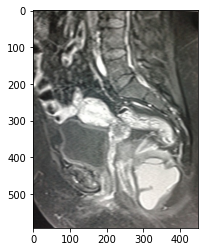

Coupe scannographique montrant la masse en contact avec le muscle grand droit de l'abdomen
ROCO_61538


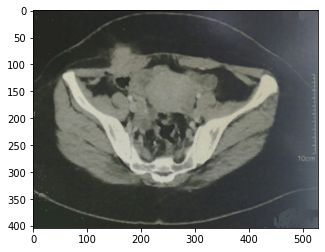

Coupe scannographique sans injection montrant une PNE gauche sur lithiase pyélique (stade 1)
ROCO_33061


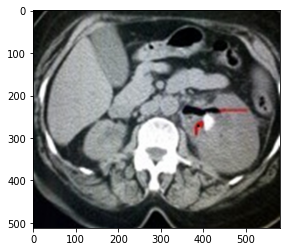

An axial CT image through the mid sacrum demonstrates an additional irregular region of sclerosis and periosteal new bone extending from midline to the right (arrows). [Powerpoint Slide]
ROCO_55184


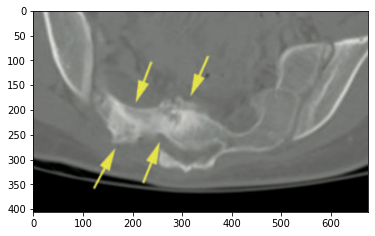

An axial CT image through the mid sacrum demonstrates an additional irregular region of sclerosis and periosteal new bone extending from midline to the right (arrows). [Powerpoint Slide]
ROCO_55184


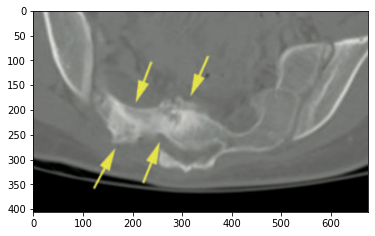

A coronal reformatted CT shows the same prominent, smooth new bone (arrows) involving the proximal femur, as was seen on the radiograph. [Powerpoint Slide]
ROCO_57148


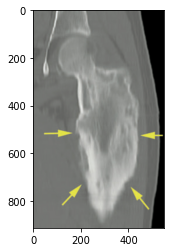

CT scan image in axial section of the femoral neck region of both hips, showing a narrow and sclerotic femoral neck.
ROCO_61849


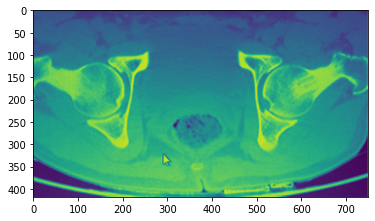

Chest CT scan at the level of main carina, showing bilateral areas of increased attenuation with a prevalent pattern of ground glass opacities. Scattered micronodules can be observed.
ROCO_11005


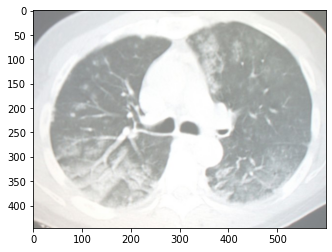

Right anterior oblique coronary angiography view of the patient. The arrows point to the stenotic sites, including the distal stenosis of the left main coronary artery, severe ostial stenosis of the left anterior descending artery, ramus intermedius artery, and left circumflex artery
ROCO_49490


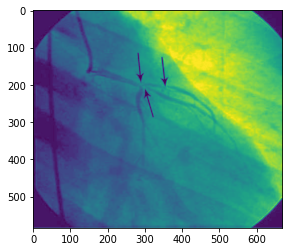

Case 1 left knee ultrasound. Transverse gray-scale and color Doppler 12–5 MHz ultrasound image obtained over the medial aspect of the knee showing abundant synovial pannus filling the subquadriceps recess as a band of hypoechoic tissue intermingled with fluid. Marked synovial hyperemia is observed at color Doppler examination indicating active pannus.
ROCO_06559


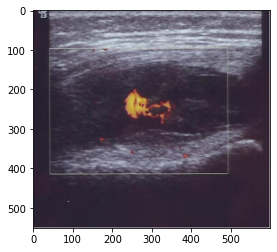

Case 1 left knee ultrasound. Transverse gray-scale and color Doppler 12–5 MHz ultrasound image obtained over the medial aspect of the knee showing abundant synovial pannus filling the subquadriceps recess as a band of hypoechoic tissue intermingled with fluid. Marked synovial hyperemia is observed at color Doppler examination indicating active pannus.
ROCO_06559


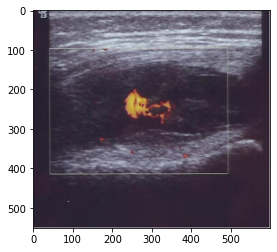

Surgical emphysema extending from the pharynx to the mediastinum
ROCO_13294


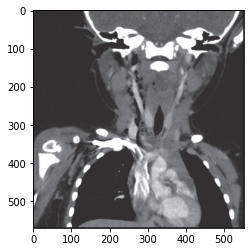

Magnetic resonance imaging of the left knee joint showing numerable finger like projections appearing hypointense in all pulse sequence is seen diffusely along the synovial membrane of left knee joint, more in suprapatellar synovial recess with tense joint effusion
ROCO_06844


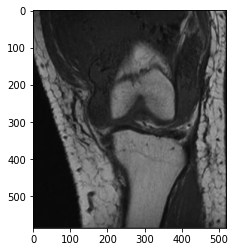

Radiograph of both lower limbs – anteroposterior view showing cystic lesion in the middle one-third-distal one-third junction of the left tibia with pathological fracture and markedly enlarged soft tissue shadow over the distal third of the leg and the foot. The right lower limb was radiologically normal
ROCO_59788


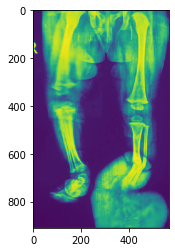

Computed tomography scanning image showing and myelography showing compression of the T11–T12 spinal segments
ROCO_41239


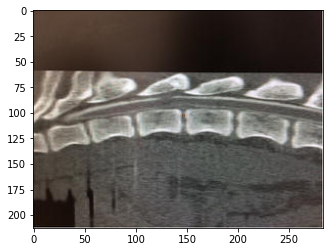

Sagital section computed tomography showing the lesion compressing the bladder anteriorly and the rectum posteriorly maintaining the intervening fat planes.
ROCO_02129


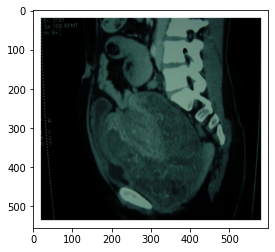

Sagital section computed tomography showing the lesion compressing the bladder anteriorly and the rectum posteriorly maintaining the intervening fat planes.
ROCO_02129


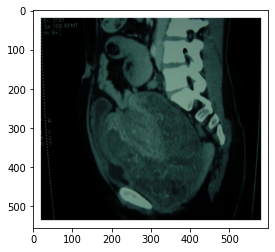

Computed tomography. Coronal view revealing emphysematous changes in the bladder wall.
ROCO_32993


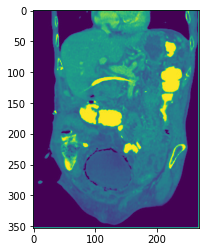

Coronal section computed tomography showing heterogeneously enhancing mass lesion engulfing the uterus, broad ligament and accompanying vessels.
ROCO_23892


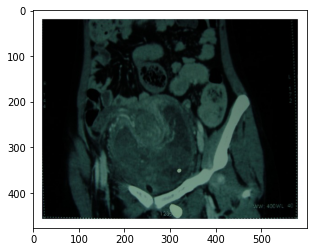

Sagittal T2-weighted magnetic resonance imaging showing a large pelvic mass (13 × 13 × 11 cm) compressing the posterior bladder wall.
ROCO_01239


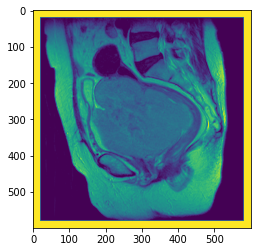

Computed tomography scan of the abdomen showing bilateral hydronephrosis and hydroureters. Computed tomography image showing bilateral hydronephrosis and hydroureters due to bladder outlet obstruction. The patient's creatinine was significantly elevated from post-renal failure. After catheterization, creatinine normalized.
ROCO_64132


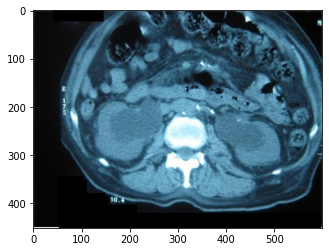

Supine X-ray of the abdomen showing a large gallstone.
ROCO_41213


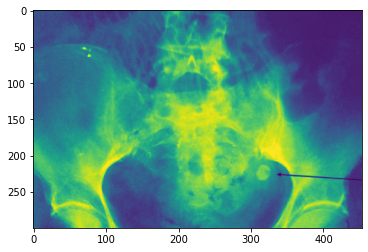

Supine X-ray of the abdomen showing a large gallstone.
ROCO_41213


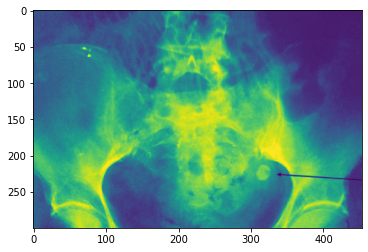

X-ray of the abdomen A-P erect showing shunt migration into the scrotum
ROCO_24111


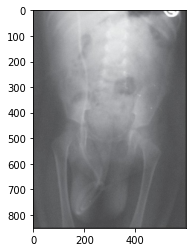

Radiography abdomen showing sacral hypoplasia.
ROCO_70628


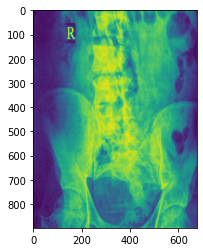

Photograph shows straight X-ray of abdomen with bilateral extensive nephrocalcinosis.
ROCO_26097


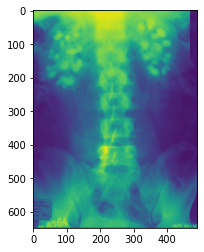

Plain abdominal radiograph. This radiograph was captured 16 hours after colonoscopy. Several loops of dilated and oedematous small bowel are visible in the left upper quadrant of the abdomen.
ROCO_36260


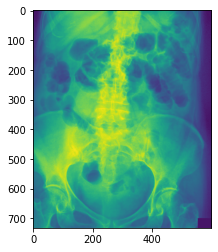

Computed tomography demonstrating a low-lying gallbladder with a diffusely thickened wall and pericholecystic fluid
ROCO_27498


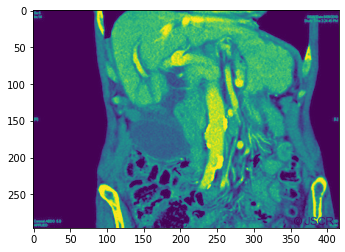

Computed tomography demonstrating a low-lying gallbladder with a diffusely thickened wall and pericholecystic fluid
ROCO_27498


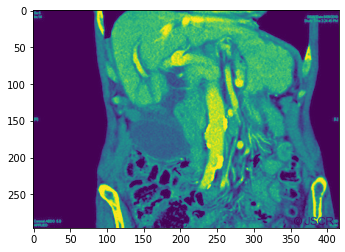

Coronal section of computed tomography scan showing acute-on-chronic pancreatitis (calcifications visible) with surgical emphysema in lower left abdominal wall planes.
ROCO_19956


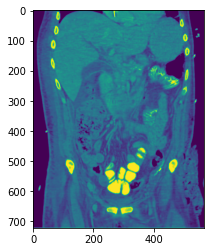

Whole-body angio-tomography showing area of hypodensity in the splenic parenchyma suggestive of splenic infarction.
ROCO_17414


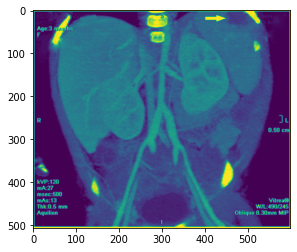

Computed tomography scan of December 1, 2014: Mild hepatomegaly, resolvent malignant zone.
ROCO_34292


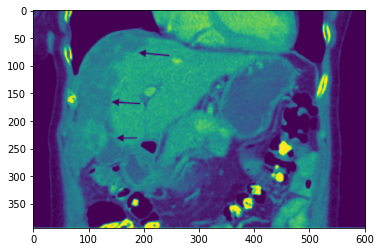

CT Abdomen with ContrastCT scan with contrast demonstrating large pancreatic head mass causing biliary obstruction with extensive intrahepatic and extrahepatic ductal dilatation and a distended gall bladder.
ROCO_12379


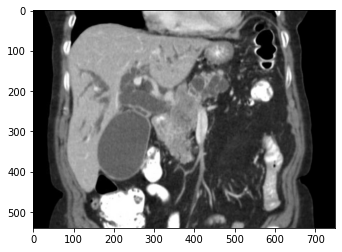

Immediate postoperative lateral cervical spine X-ray
ROCO_21179


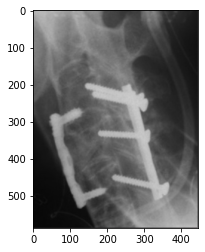

Immediate postoperative lateral cervical spine X-ray
ROCO_21179


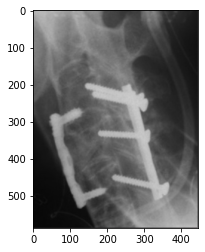

Preoperative lateral cervical X-ray.
ROCO_02296


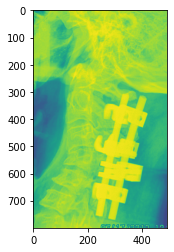

Postoperative lateral radiography of the cervical spine.
ROCO_71906


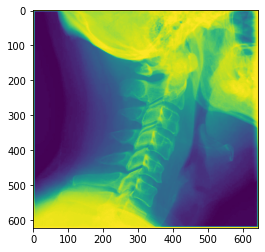

Lateral cervical spine radiograph confirming bilateral C5–C6 facet dislocation.
ROCO_45173


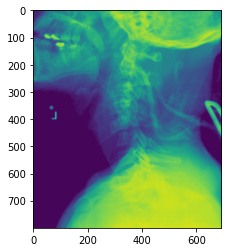

Preoperative Magnetic resonance imaging (MRI) cervical spine (post contrast-axial) showing well-defined contrast enhancing intradural extradural lesion with the cord pushed to the left (arrow)
ROCO_28303


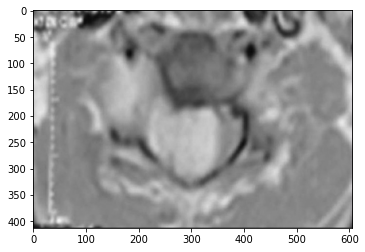

In [64]:
%matplotlib inline
index =0
for item in postingidList:
    try:
        print(titleList[index])
        print(keyList[index])
        imagePath = '/content/roco-dataset/data/train/radiology/images/'+ imageList[index] + '.jpg'
        pil_im = Image.open(imagePath, 'r')
        plt.figure()
        plt.imshow(pil_im)
        plt.show()
        matching_indices = matchesList[index].split(' ')
        print('==================')
        for ind in matching_indices:
            print(titleList[int(ind)])
            print(keyList[int(ind)])
            imagePath = '/content/roco-dataset/data/train/radiology/images/'+ imageList[int(ind)] + '.jpg'
            pil_im = Image.open(imagePath, 'r')
            plt.figure()
            plt.imshow(pil_im)
            plt.show()
        index= index +1
        if index == 10:
            break
    except FileNotFoundError:
        print('huh')


In [65]:
testcembList=[]
testimageList=[]
testtitleList=[]
for index, row in X_test.iterrows():
    txt_emb = get_textEmbeddings(model,str(row[1]))
    imagePath = '/content/roco-dataset/data/test/radiology/images/'+row[0]+'.jpg'
    img_emb = get_imageEmbeddings(img_model,imagePath)
    text_embeddings[row[0]] = txt_emb
    image_embeddings[row[0]] = img_emb
    cmb_emb = np.concatenate((txt_emb.cpu().numpy(),img_emb),axis=0)
    norm = np.linalg.norm(cmb_emb)
    cmb_emb_normal = cmb_emb/norm
    testcembList.append(cmb_emb_normal)
    testimageList.append(row[0])
    testtitleList.append(row[1])

testkeyList = testimageList

In [66]:
testpostingidList=[]
testmatchesList=[]
index =0
for val in testkeyList:
    query_emb = testcembList[index]
    postingid_list = getNeighbours(query_emb)
    testpostingidList.append(val)
    testmatchesList.append(" ".join(postingid_list))
    index =index +1 
    if index==100:
        break

In [67]:
def create_df_set(filepath):
    cuis = open(filepath, 'r')

    cuis_dict = dict()

    for line in cuis:
        line_list = line.split('\t')
        cuis_dict[line_list[0]] = line_list[2:-1]
        cuis_dict[line_list[0]].append(line_list[-1].strip('\n'))
        

    return cuis_dict

In [68]:
cuis_train = create_df_set('./roco-dataset/data/train/radiology/cuis.txt')
cuis_test = create_df_set('./roco-dataset/data/test/radiology/cuis.txt')

Medial-lateral oblique mammogram of the left breast demonstrating a large spiculated mass with calcifications in the upper aspect of the breast (marked by arrows); biopsy of the mass revealed HER2-overexpressing infiltrating ductal breast cancer.
ROCO_66827


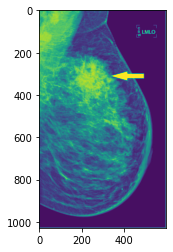

Histologically proven normal breast parenchyma in a 69-year-old woman. The left craniocaudal view mammogram is normal.
ROCO_23335
Revelant


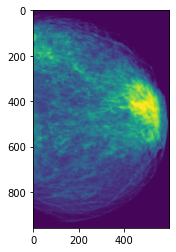

Digital radiography examination revealed a 5.0×4.0×4.0 cm mass with an increased density shadow in the left breast.
ROCO_68654
Revelant


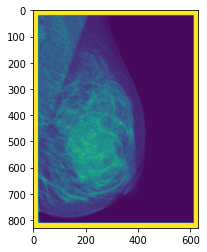

Second-look ultrasound of the nodule in figure 1. US shows homogeneous splenic-like echogenicity of the nodule in the paracolic space, thus confirming its splenic origin.
ROCO_70816


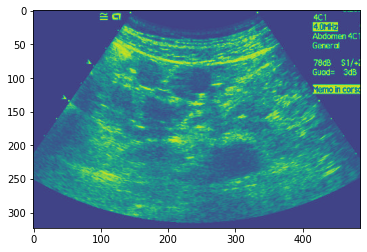

Diagnostic craniocaudal left mammographic view demonstrating an area of tubular densities compatible with dilated ducts within the outer breast (arrow)
ROCO_57784
Revelant


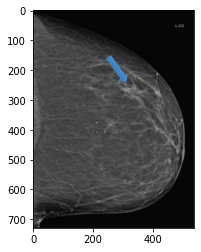

Kidney ultrasonography finding. Before transplantation, ultrasonography showed decreased kidney size (right 8.4 × 4 × 3 cm, left 8.5 × 4 × 3 cm) and lobulated contour and increased parenchymal echogenicity (arrow). Above finding suggest the advanced chronic change of kidney.
ROCO_44660
Revelant


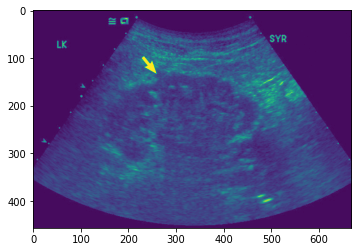

Transverse MRI section of left tibia.
ROCO_08782


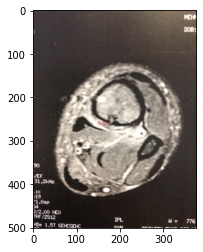

MRI: Heterogeneous mass of the left parotid lodge
ROCO_44406


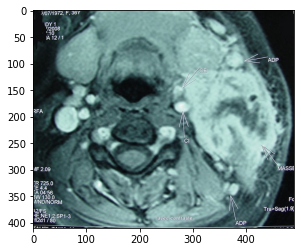

AP x-ray of the left foot on presentation.
ROCO_46495


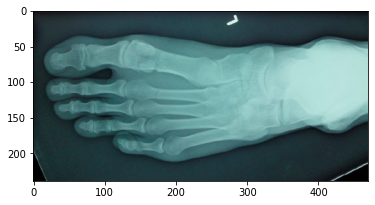

T2-weighted MRI showing a left sided non-occlusive dissection extending to the level of the petrous segment (arrow).
ROCO_46553


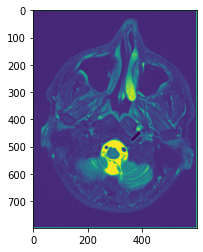

Axial MRI of the left leg shows the pseudoaneurysm of the posterior tibial artery.
ROCO_79031
Revelant


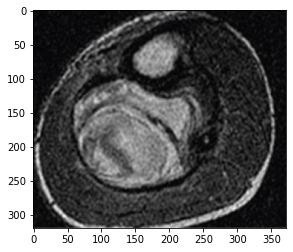

Staging MRI scan showing destructive lesion left maxilla
ROCO_77947


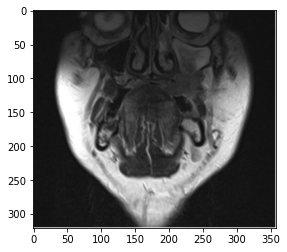

ᅟFollow-up cMRI scan performed 5 days later from first cMRI
ROCO_19741


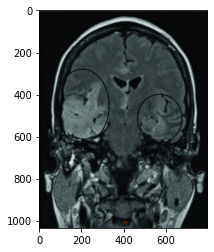

MRI examination performed at 5 months after surgery. T1-weighted image after contrast administration, coronal plane: in the sphenoid sinus there is the round structure with slight peripheral enhancement.
ROCO_54160


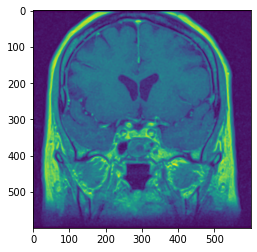

Diffusion weighted MRI, day 5 in ICU
ROCO_46464


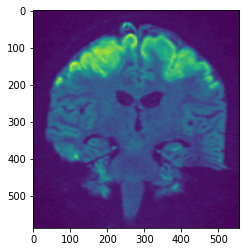

ᅟTurbo inversion recovery magnitude (TIRM) cMRI scan taken at day three after beginning of symptoms
ROCO_11980
Revelant


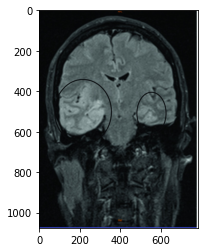

MRI examination performed at 5 months after surgery. T2-weighted image before contrast administration, coronal plane: in the sphenoid sinus there is the implanted muscle and fascia.
ROCO_67582


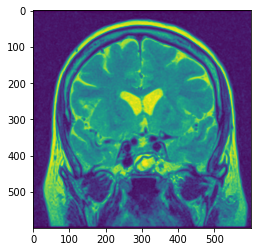

This AP radiograph taken 5.5 months after frame application showed callus formation.
ROCO_47963


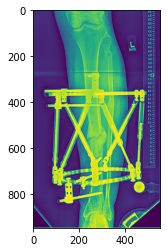

AP view.
ROCO_55218


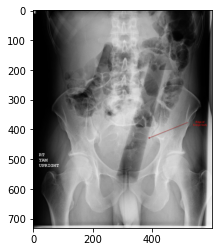

Postobturation IOPA
ROCO_03093
Revelant


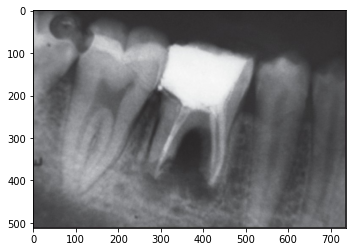

Implants placed
ROCO_60755


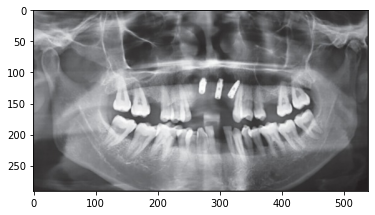

The apex of the BA that is set as point A is connected to the bifurcation of the ICA, which is set as point B, to make the line AB. The line connecting A and B is extended and projected onto the cranium, which is set as point C. The ABC line on the image is provided by maximum intensity projection (MIP)
ROCO_14422


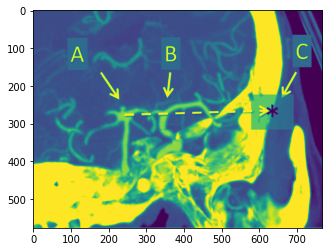

AP view of the left foot post-operative.
ROCO_34772


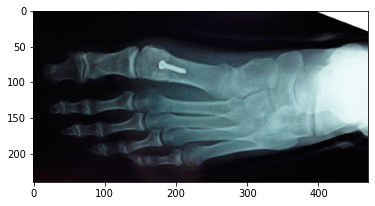

Full mouth OPT.
ROCO_52990
Revelant


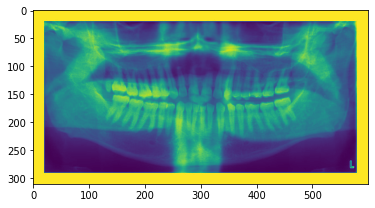

The transthoracic echocardiography demonstrates a low echoic mass (26×30 mm) (dotted arrow) located between the atrial septum and the noncoronary sinus. LA: left atrium, RA: right atrium, RV: right ventricle.
ROCO_31374


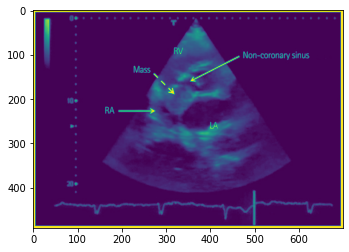

Transesophageal echocardiography∗ revealed left aneurysm of sinus of Valsalva (LASV) and right aneurysm of sinus of Valsalva (RASV) with thrombus within it, causing RVOT obstruction. ∗Aortic valve short-axis view at midesophageal level.
ROCO_64113
Revelant


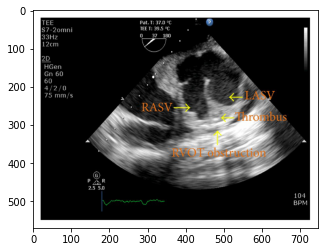

Transthoracic echocardiogram (TTE) image of the parasternal short axis view at level of mitral valve showing pericardial effusion with right ventricular free-wall buckling during diastole (arrow).
ROCO_74561
Revelant


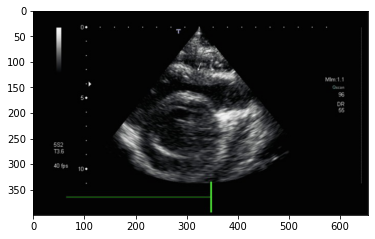

Transthoracic two-dimensional echocardiography, showing dilated right ventricle and right atrium, flail anterior leaflet of the tricuspid valve, and thickened and partly mobile posterior leaflet of the tricuspid valve from the parasternal long-axis view of the right ventricular inflow tract at mid-systoleLA, Left atrium; LV, Left ventricle; RA, Right atrium; RV, Right ventricle; A, Anterior leaflet of the tricuspid valve; P, Posterior leaflet of the tricuspid valve
ROCO_36522
Revelant


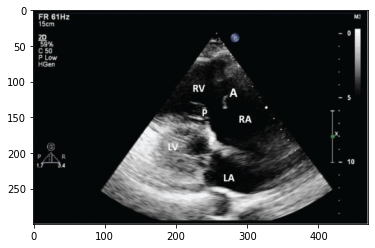

Parasternal short-axis view of mitral annulus calcification (MAC) by transthoracic echocardiography.
ROCO_55451
Revelant


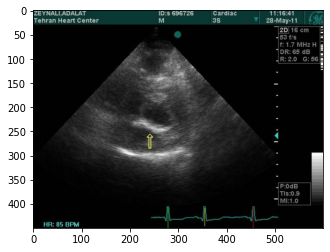

Normal right upper quadrant FAST view showing no free fluid in Morison’s pouch (RUQ2).
ROCO_75509
Revelant


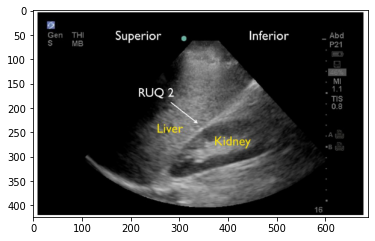

CT abdomen with and without contrast.
ROCO_25267


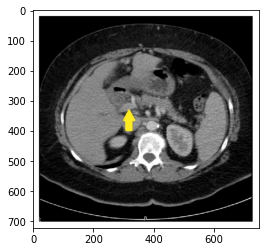

CT abdomen and pelvis, coronal view. Torsion of lipomatous appendage of falciform ligament circled.
ROCO_37048
Revelant


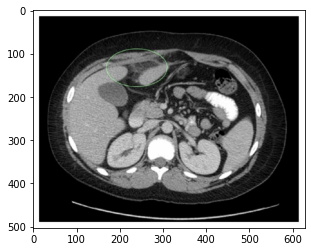

Contrast CT, transverse view of abdomen.
ROCO_14206
Revelant


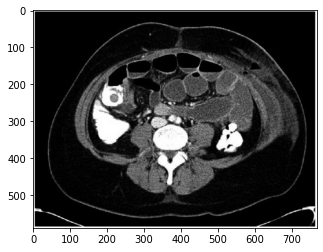

CT of the abdomen with contrast in venous phaseThe hepatic lesion became progressively isodense in venous phase.
ROCO_12494
Revelant


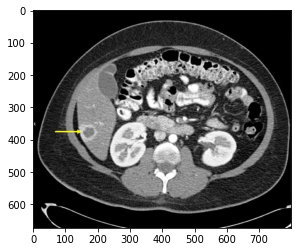

CT of the abdomen with two arrows showing the areas of low-density within the posterior paraspinal muscles.
ROCO_52294
Revelant


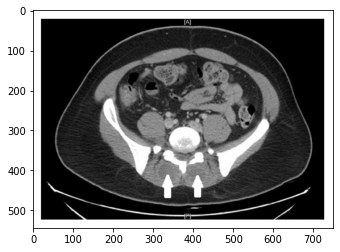

CT of abdomen without contrast showing lymphadenopathy.
ROCO_06213
Revelant


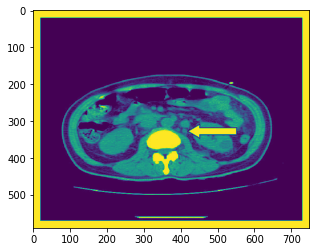

Coronal T2-weighted magnetic resonance imaging scan showing the arachnoid cyst with the compression of the brain stem
ROCO_54195


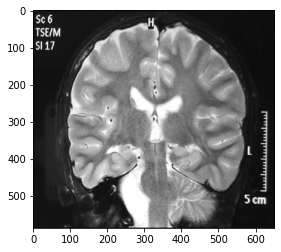

Magnetic resonance imaging of brain (T1-weighted image; contrast-enhanced) showing single ring-enhancing lesion (yellow arrow) in the dorsal part of the midbrain with significant perifocal edema in adjacent part of brainstem, right cerebellar peduncle, adjacent thalamocortical tract, and periventricular region
ROCO_73695
Revelant


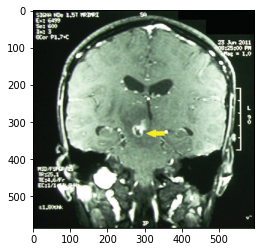

T2-weighted coronal image of the brain revealed marked hyperostosis of the entire calvarium (arrow), temporal bone (arrow), and visualized cervical vertebra (arrow).
ROCO_39306
Revelant


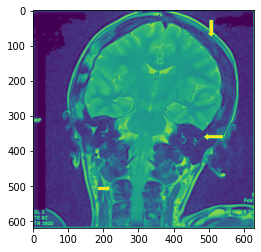

Enhanced axial CT showing bulky lymph node metastases extending from the left inguinal into the external iliac chain.
ROCO_80239


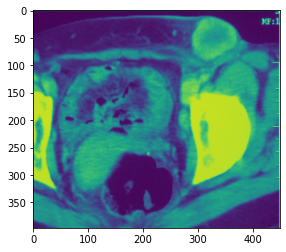

Contrast axial MRI shows the extension of the tumor into the internal auditory canal represents “shark fin” appearance (white arrow).
ROCO_12573


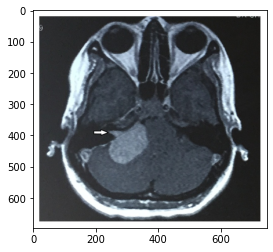

Contrast coronal MRI shows well-defined heterogeneously enhancing T1 hypo and T2 predominantly hyperintense lesion in the right cerebellopontine angle (white arrow).
ROCO_22030


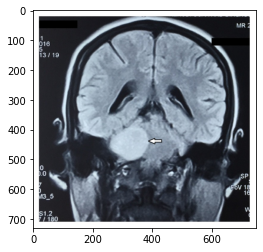

Computed tomographic images of selected orbital roof lesions where the intraoperative use of the video-endoscope is a useful adjunct, b) Langerhans cell histiocytosis (eosinophilic granuloma) involving the left superolateral orbital roof (arrow)
ROCO_61730


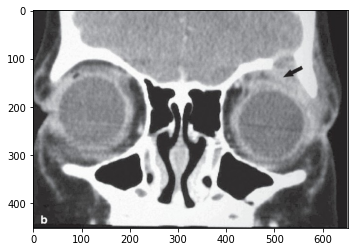

Orthopantomogram showing well-defined radiolucency with scalloped border.Notes: Few areas showing multiple foci of radiopacity. There is obvious evidence of root resorption.
ROCO_00722


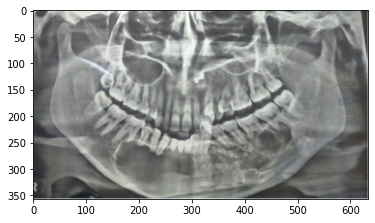

MRI of cranium showing thick cyst wall enhancement with mild perilesional edema, depicting colloidal–vesicular stage of cysticercosis in pontomedullary area
ROCO_69186


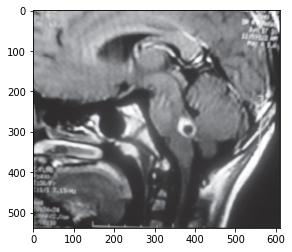

An expansile, lytic mass involving right zygoma and lateral wall of right orbit (Contrast enhancing computed tomography)
ROCO_00351
Revelant


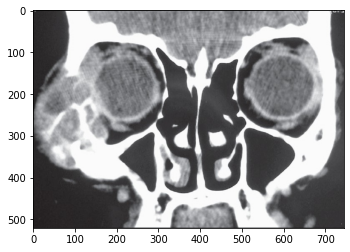

Contrast-enhanced computed tomography of the gut mass (arrow). Coronal section shows a well-defined, oval, soft tissue mass measuring 9.1×5×5.1cm in the upper abdomen, compressing the duodenum. Because of its location and nature, the mass was thought to be a gastrointestinal stromal tumor.
ROCO_37104
Revelant


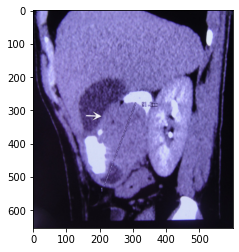

Method of assessing adenoid enlargement on lateral neck radiography. In this method the adenoidal measurement (A) represents the distance from the point of maximal convexity of the adenoid shadow to a line along the anterior margin of the basiocciput. The nasopharyngeal measurement (N) is the distance between the posterior border of the hard palate and the antero-inferior edge of the sphenobasioccipital synchondrosis.
ROCO_27980


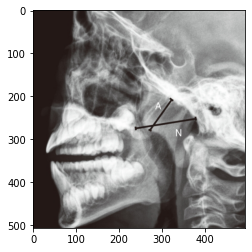

Followup chest X-ray after treatment of the hemopneumothorax demonstrated a mass localized in right thorax
ROCO_34476


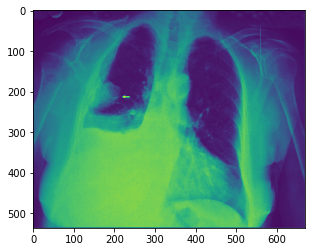

Chest X‐ray: bowel is visualized in the thorax
ROCO_77803
Revelant


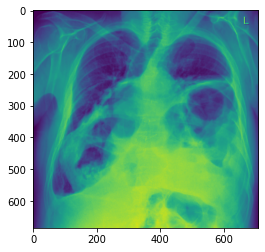

Follow-up chest X-ray suggesting erosion of right ventricular lead into the pleural space and into the chest wall. Anatomically, this corresponded to the cutaneous bruising
ROCO_05719
Revelant


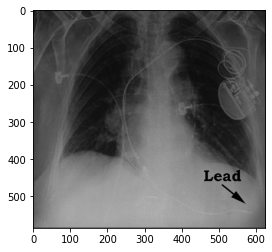

CT thorax of this patient demonstrating pneumomediastinum.
ROCO_66800
Revelant


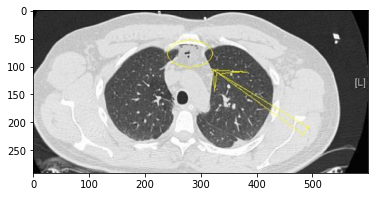

Postoperative chest radiograph after thoracoscopic-assisted esophagectomy and laparoscopic gastric pull-up demonstrates the gastric conduit occupying a large portion of the right hemithorax.
ROCO_65261
Revelant


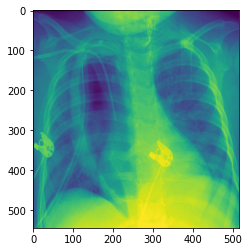

Right-sided pneumothorax as shown by the arrows (Right) on initial chest X-ray with tracheostomy tube repositioned (Top arrow)
ROCO_46537
Revelant


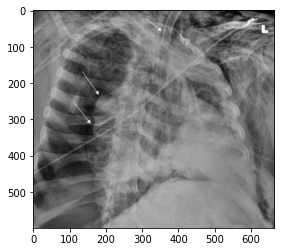

Heavily calcified left anterior descending artery (arrows) with entrapped burr at distal.
ROCO_64290


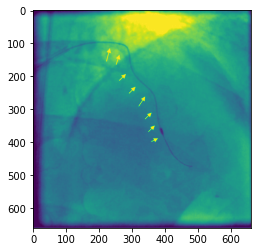

The left circumflex artery was heavily calcified (arrows) and the burr was entrapped at middle part.
ROCO_71932
Revelant


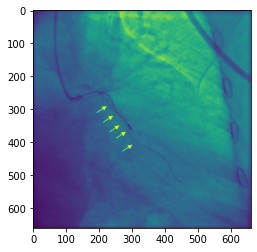

Aortogram in lateral view showed a large aortopulmonary collateral supplying the left lower lobe
ROCO_29668


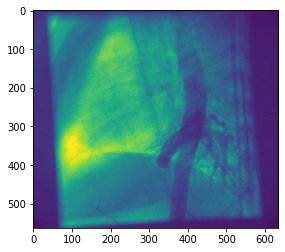

ERCP imaging showed deep cannulation of the guide wire into the left intrahepatic bile duct (arrowheads).
ROCO_25668


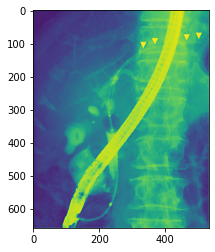

Angiography from the left gastric artery showing vessel transection (arrow).
ROCO_60536
Revelant


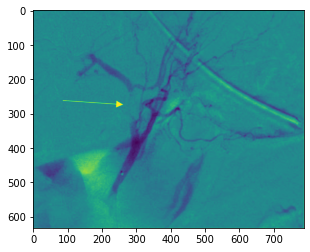

Coronary angiography in the left anterior oblique projection with cranial angulation demonstrates an anomalous vessel originating from the midportion of the left anterior descending artery (black arrow), which travels along the free wall of the right ventricle into the atrioventricular groove and gives rise to a posterior descending artery (white arrow).
ROCO_22755
Revelant


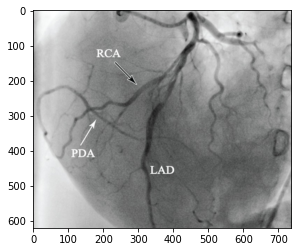

In [69]:
%matplotlib inline
index =10
while index <20:
    print(testtitleList[index])
    print(testkeyList[index])
    imagePath = '/content/roco-dataset/data/test/radiology/images/'+ testimageList[index] + '.jpg'
    pil_im = Image.open(imagePath, 'r')
    plt.figure()
    plt.imshow(pil_im)
    plt.show()
    matching_indices = testmatchesList[index].split(' ')
    print('==================')
    for ind in matching_indices:
        print(titleList[int(ind)])
        print(keyList[int(ind)])
        intersected_tr_te = set(cuis_train[keyList[int(ind)]]).intersection(set(cuis_test[testimageList[index]]))
        if len(intersected_tr_te) >=1:
          print("Revelant")
        # for i in cuis_train[keyList[int(ind)]]:
        #   if i in cuis_test[testimageList[index]]:
        #     print("Revelant")
        #     break
        imagePath = '/content/roco-dataset/data/train/radiology/images/'+ imageList[int(ind)] + '.jpg'
        pil_im = Image.open(imagePath, 'r')
        plt.figure()
        plt.imshow(pil_im)
        plt.show()
    index= index +1

In [70]:
cuis_docs_tr = {}

train_cuis = open('/content/roco-dataset/data/train/radiology/cuis.txt','r')

for line in train_cuis:
    line_list = line.split('\t')
    value_list = line_list[2:-1]
    value_list.append(line_list[-1].strip('\n'))
    
    for i in value_list:
        if i in cuis_docs_tr.keys():
            cuis_docs_tr[i].append(line_list[0])
        else:
            cuis_docs_tr[i] = [line_list[0]]


In [71]:
relevant_docs_dict = {}

for k,v in cuis_test.items():
    for i in v:
        if k in relevant_docs_dict.keys():
            if i in cuis_docs_tr.keys():
                for j in cuis_docs_tr[i]:
                    relevant_docs_dict[k].add(j)
        else:
            relevant_docs_dict[k] = set()
            if i in cuis_docs_tr.keys():
                for j in cuis_docs_tr[i]:
                    relevant_docs_dict[k].add(j)
                

In [72]:

# max_len = 0
# for k,v in relevant_docs_dict.items():
#     if len(v) > max_len:
#         print(k,len(v))
#         max_len = len(v)
#         max_k  = k
# print(max_k,max_len)
av_temp = 0
count = 0
for v in relevant_docs_dict.values():
  av_temp += len(v)
  count +=1

print("Average number of relevant documents", av_temp/count)


Average number of relevant documents 11133.92786404206


In [73]:
retrived_docs = {}
for i, row in X_test.iterrows():
    txt_emb = get_textEmbeddings(model,str(row[1]))
    imagePath = '/content/roco-dataset/data/test/radiology/images/'+row[0]+'.jpg'
    img_emb = get_imageEmbeddings(img_model,imagePath)
    text_embeddings[row[0]] = txt_emb
    image_embeddings[row[0]] = img_emb
    cmb_emb = np.concatenate((txt_emb.cpu().numpy(),img_emb),axis=0)
    norm = np.linalg.norm(cmb_emb)
    cmb_emb_normal = cmb_emb/norm
    postingid_list = getNeighbours(cmb_emb_normal)
    neighbour_list = []
    for i in postingid_list:
        neighbour_list.append(imageList[int(i)])
    retrived_docs[row[0]] = neighbour_list

In [75]:
mAP_calc = 0
for query,retrived_docs_list in retrived_docs.items():
    doc_count = 0
    preci_doc_count = 0
    preci_dict = {}
    AP_calc = 0 
    print()
    relevant_docs_query = len(relevant_docs_dict[query])
    
    for doc in retrived_docs_list:
        doc_count +=1
        intersection_cuis = set(cuis_test[query]).intersection(cuis_train[doc])
        if len(intersection_cuis) >= 1:
            preci_doc_count+=1
        print(query, end = " ")
        print(f"P@{doc_count}", preci_doc_count/doc_count, end = " ")
        print(f"R@{doc_count}", preci_doc_count/max(min(relevant_docs_query,doc_count),1), end = " ")
        if f"P@{doc_count}" in preci_dict.keys():
            preci_dict[f"P@{doc_count}"] += preci_doc_count/doc_count
        else:
            preci_dict[f"P@{doc_count}"] = preci_doc_count/doc_count
            
        AP_calc += (preci_doc_count/doc_count) * (preci_doc_count/max(min(relevant_docs_query,doc_count),1))
        
    AP_calc /= max(min(relevant_docs_query,doc_count),1)
    mAP_calc +=  AP_calc
    
    
for i in preci_dict.keys():
    preci_dict[i] /= len(retrived_docs.keys())

print(preci_dict)
print(mAP_calc/len(retrived_docs.keys()))

Streaming output truncated to the last 5000 lines.
ROCO_72267 P@1 0.0 R@1 0.0 ROCO_72267 P@2 0.0 R@2 0.0 ROCO_72267 P@3 0.3333333333333333 R@3 0.3333333333333333 ROCO_72267 P@4 0.25 R@4 0.25 ROCO_72267 P@5 0.2 R@5 0.2 
ROCO_38222 P@1 1.0 R@1 1.0 ROCO_38222 P@2 0.5 R@2 0.5 ROCO_38222 P@3 0.6666666666666666 R@3 0.6666666666666666 ROCO_38222 P@4 0.5 R@4 0.5 ROCO_38222 P@5 0.4 R@5 0.4 
ROCO_56081 P@1 1.0 R@1 1.0 ROCO_56081 P@2 0.5 R@2 0.5 ROCO_56081 P@3 0.6666666666666666 R@3 0.6666666666666666 ROCO_56081 P@4 0.75 R@4 0.75 ROCO_56081 P@5 0.8 R@5 0.8 
ROCO_20666 P@1 1.0 R@1 1.0 ROCO_20666 P@2 1.0 R@2 1.0 ROCO_20666 P@3 1.0 R@3 1.0 ROCO_20666 P@4 1.0 R@4 1.0 ROCO_20666 P@5 1.0 R@5 1.0 
ROCO_67706 P@1 1.0 R@1 1.0 ROCO_67706 P@2 0.5 R@2 0.5 ROCO_67706 P@3 0.3333333333333333 R@3 0.3333333333333333 ROCO_67706 P@4 0.25 R@4 0.25 ROCO_67706 P@5 0.2 R@5 0.2 
ROCO_76987 P@1 1.0 R@1 1.0 ROCO_76987 P@2 1.0 R@2 1.0 ROCO_76987 P@3 0.6666666666666666 R@3 0.6666666666666666 ROCO_76987 P@4 0.75 R@4 0.75 ROC